In [3]:
from PIL import Image
import numpy as np


In [48]:
def load_image(image_path):
    image = Image.open(image_path)
    image = image.convert('RGB')
    image = np.array(image) / 255.0  # Normalize RGB values to [0, 1]
    return image


In [64]:
def display_image(imageMatrix, scale=1):
    imageMatrix = (imageMatrix * 255).astype(np.uint8)
    image = Image.fromarray(imageMatrix)
    display(image.resize((image.width * scale, image.height * scale)))


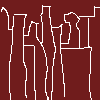

In [52]:
image = load_image('images/city.png')
display_image(image)

In [60]:
def compute_retarded_time(x, y, v, L, max_iter=10):
    """
    Solve for the retarded time t_r that satisfies:
        t_r + sqrt((x + v*t_r)**2 + y**2 + L**2) = 0.
    """
    # Initial guess assuming v=0.
    t = -np.sqrt(x**2 + y**2 + L**2)
    for _ in range(max_iter):
        denom = np.sqrt((x + v * t)**2 + y**2 + L**2)
        f_val = t + denom
        # Derivative: 1 + (v*(x+v*t))/denom.
        f_deriv = 1 + (v * (x + v * t)) / denom
        t = t - f_val / f_deriv
    return t

def compute_projected_coordinates(x, y, v, t_r, L, f):
    """
    Using the retarded time, compute the observed (warped) coordinates.
    """
    # Compute the emission point of the pixel.
    X = x + v * t_r  # Shift due to motion (warping effect)
    Y = y          # y coordinate remains unchanged
    # Apply a simple perspective projection.
    u = X * f / L
    w = Y * f / L
    return u, w, X, Y

def compute_doppler_shift(X, Y, L, v):
    """
    Calculate the Doppler shift factor for the light coming from (X, Y, 0).
    """
    r = np.sqrt(X**2 + Y**2 + L**2)
    # For motion along x, cos(theta) is X/r.
    cos_theta = X / r  
    doppler = np.sqrt((1 + v * cos_theta) / (1 - v * cos_theta))
    return doppler

def adjust_color(color, doppler):
    """
    Adjust the RGB color based on the Doppler factor.
    Here, red is decreased (red-shift) and blue is increased (blue-shift) heuristically.
    """
    new_color = np.empty_like(color)
    new_color[0] = np.clip(color[0] / doppler, 0, 1)  # Red channel
    new_color[1] = color[1]                            # Green left unchanged
    new_color[2] = np.clip(color[2] * doppler, 0, 1)   # Blue channel
    return new_color

def relativistic_transform(image, v=0.75, L=10.0, width_phys=2.0, height_phys=2.0, f=1.0):
    """
    Apply a simplified relativistic transformation to an image.
    
    Parameters:
      image      : Input image as a (H, W, 3) NumPy array with values in [0,1].
      v          : Speed of the object (as a fraction of c).
      L          : Observer distance (distance from observer to image plane).
      width_phys : Physical width of the image plane.
      height_phys: Physical height of the image plane.
      f          : Focal length used for projection.
      
    Returns:
      out_image  : Transformed image (same resolution as input).
      ranges     : Tuple (u_min, u_max, w_min, w_max) for the computed projected coordinates.
    """
    H, W, _ = image.shape

    # Map pixel indices to physical coordinates.
    xs = np.linspace(-width_phys / 2, width_phys / 2, W)
    ys = np.linspace(-height_phys / 2, height_phys / 2, H)
    
    out_coords = []  # Will hold (u, w) coordinates on the observer's image plane.
    out_colors = []  # Will hold the adjusted colors.
    
    # Process each pixel.
    for i in range(H):
        y = ys[i]
        for j in range(W):
            x = xs[j]
            # 1. Compute retarded time for this pixel.
            t_r = compute_retarded_time(x, y, v, L, max_iter=10)
            # 2. Compute the projected coordinates.
            u, w, X, Y = compute_projected_coordinates(x, y, v, t_r, L, f)
            # 3. Compute the Doppler shift factor.
            doppler = compute_doppler_shift(X, Y, L, v)
            # 4. Adjust the pixel color.
            new_color = adjust_color(image[i, j, :], doppler)
            
            out_coords.append((u, w))
            out_colors.append(new_color)
    
    out_coords = np.array(out_coords)  # (N, 2) where N = H*W
    out_colors = np.array(out_colors)  # (N, 3)
    
    # Determine coordinate bounds to map them to output pixel indices.
    u_min, u_max = out_coords[:, 0].min(), out_coords[:, 0].max()
    w_min, w_max = out_coords[:, 1].min(), out_coords[:, 1].max()
    
    # Create an output image grid (using the same resolution as the input).
    H_out, W_out = H, W
    out_image = np.zeros((H_out, W_out, 3), dtype=np.float32)
    count = np.zeros((H_out, W_out), dtype=np.int32)
    
    # Map each computed coordinate to an output pixel.
    for (u, w), color in zip(out_coords, out_colors):
        j_out = int((u - u_min) / (u_max - u_min) * (W_out - 1))
        i_out = int((w - w_min) / (w_max - w_min) * (H_out - 1))
        out_image[i_out, j_out, :] += color
        count[i_out, j_out] += 1

    # Average contributions where multiple source pixels fall into the same output pixel.
    mask = count > 0
    out_image[mask] /= count[mask, None]
    
    return out_image, (u_min, u_max, w_min, w_max)

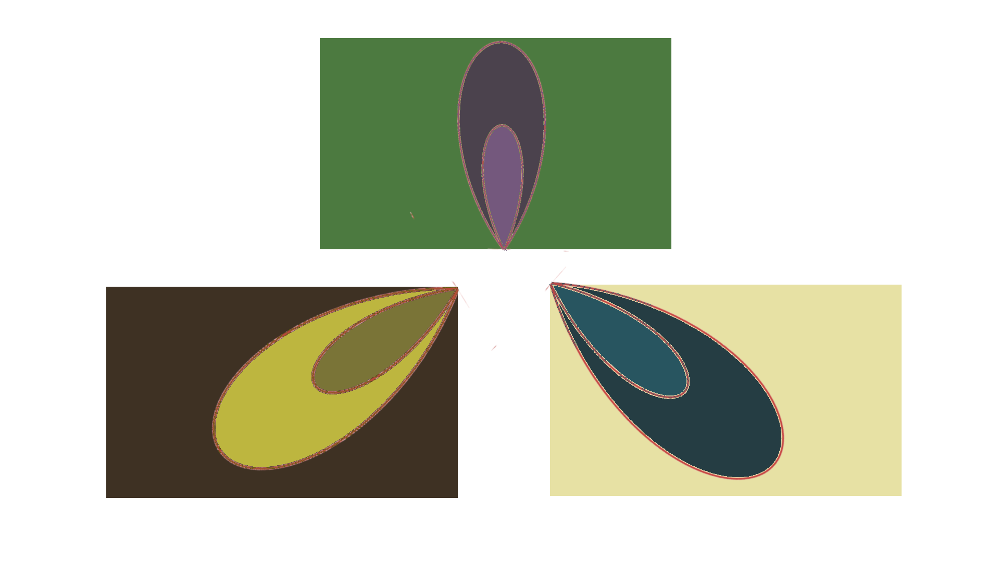

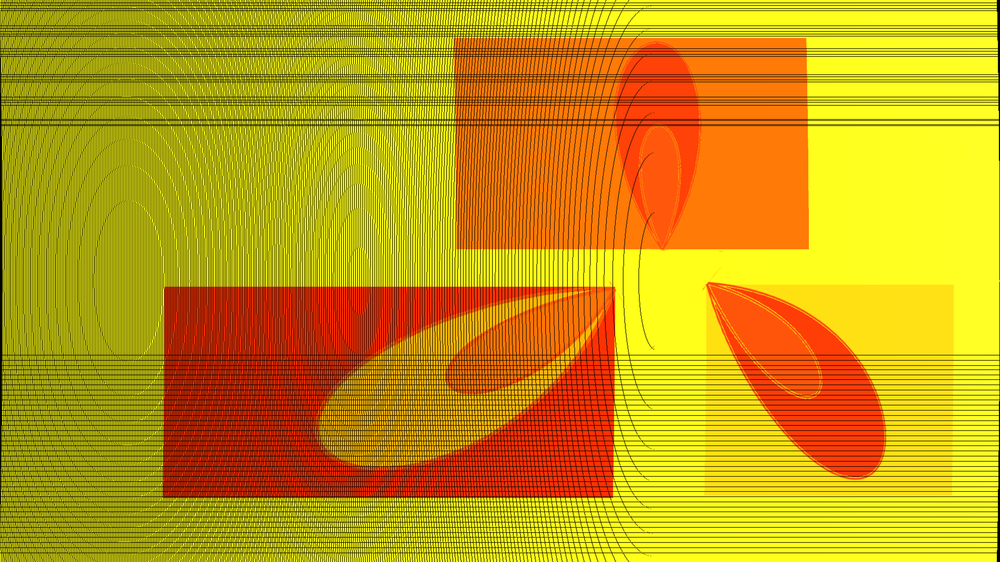

In [72]:
img = load_image("images/Untitled.png")

# Set parameters: v (fraction of c), observer distance L, etc.
params = {
    "v": 0.99, # 75% of the speed of light
    "L": 20.0, # Observer distance from the image plane
    "width_phys": 4.0, # Physical width of the image plane
    "height_phys": 4.0, # Physical height of the image plane

}


# Apply the relativistic transformation.
transformed, ranges = relativistic_transform(img, **params)
display_image(img,scale=3)
display_image(transformed, scale=3)